In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
from sklearn import datasets
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge #ordinary linear regression + w/ ridge regularization
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import folium

read file 

In [2]:
df = pd.read_csv('yellow_tripdata_2020-01.csv')

/Users/maithaalqahtani/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
df.shape

(6405008, 18)

In [4]:
df_sample= df.sample(n = 1000000)

In [5]:
df_sample

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
3447717,2.0,2020-01-18 09:34:38,2020-01-18 09:36:35,1.0,0.35,1.0,N,113,90,1.0,3.5,0.0,0.5,1.70,0.00,0.3,8.50,2.5
5947986,1.0,2020-01-30 12:04:35,2020-01-30 12:12:35,1.0,1.10,1.0,N,41,166,2.0,7.0,0.0,0.5,0.00,0.00,0.3,7.80,0.0
5352792,2.0,2020-01-27 16:05:32,2020-01-27 16:10:45,1.0,0.77,1.0,N,140,140,1.0,5.0,1.0,0.5,0.56,0.00,0.3,9.86,2.5
6061337,1.0,2020-01-30 20:58:46,2020-01-30 21:02:54,1.0,0.40,1.0,N,162,162,1.0,4.5,3.0,0.5,1.75,0.00,0.3,10.05,2.5
4388930,2.0,2020-01-23 07:42:37,2020-01-23 07:57:49,1.0,2.54,1.0,N,75,162,1.0,12.0,0.0,0.5,2.30,0.00,0.3,17.60,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1763864,1.0,2020-01-10 14:11:07,2020-01-10 14:13:56,2.0,0.30,1.0,N,229,229,1.0,4.0,2.5,0.5,2.00,0.00,0.3,9.30,2.5
2722308,1.0,2020-01-15 04:44:43,2020-01-15 04:51:33,1.0,2.40,1.0,N,263,162,1.0,8.5,3.0,0.5,1.23,0.00,0.3,13.53,2.5
4308732,1.0,2020-01-22 19:50:53,2020-01-22 19:55:14,0.0,1.10,1.0,N,140,263,2.0,5.5,3.5,0.5,0.00,0.00,0.3,9.80,2.5
471320,2.0,2020-01-03 19:34:48,2020-01-03 20:12:53,2.0,18.41,2.0,N,132,79,2.0,52.0,4.5,0.5,0.00,6.12,0.3,65.92,2.5


In [6]:
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000000 entries, 3447717 to 4158222
Data columns (total 18 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   VendorID               989723 non-null   float64
 1   tpep_pickup_datetime   1000000 non-null  object 
 2   tpep_dropoff_datetime  1000000 non-null  object 
 3   passenger_count        989723 non-null   float64
 4   trip_distance          1000000 non-null  float64
 5   RatecodeID             989723 non-null   float64
 6   store_and_fwd_flag     989723 non-null   object 
 7   PULocationID           1000000 non-null  int64  
 8   DOLocationID           1000000 non-null  int64  
 9   payment_type           989723 non-null   float64
 10  fare_amount            1000000 non-null  float64
 11  extra                  1000000 non-null  float64
 12  mta_tax                1000000 non-null  float64
 13  tip_amount             1000000 non-null  float64
 14  tolls_amount

In [7]:
sample_train, sample_test = train_test_split(df_sample, test_size=0.2,random_state=0)

In [8]:
sample_test.shape

(200000, 18)

In [9]:
sample_train, sample_val = train_test_split(sample_train, test_size=0.25,random_state=0)

In [10]:
sample_val.shape

(200000, 18)

In [11]:
sample_train.shape

(600000, 18)

In [12]:
sample_train.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
5115161,2.0,2020-01-26 11:22:55,2020-01-26 11:30:22,5.0,1.09,1.0,N,162,237,2.0,6.5,0.0,0.5,0.00,0.0,0.3,9.80,2.5
1789821,1.0,2020-01-10 16:58:38,2020-01-10 17:18:29,1.0,6.40,1.0,N,261,164,1.0,22.0,3.5,0.5,5.25,0.0,0.3,31.55,2.5
533547,1.0,2020-01-04 06:06:22,2020-01-04 06:27:44,1.0,13.50,1.0,N,132,226,2.0,36.5,0.0,0.5,0.00,0.0,0.3,37.30,0.0
1200838,2.0,2020-01-07 20:48:25,2020-01-07 21:02:22,1.0,3.79,1.0,N,162,232,1.0,14.0,0.5,0.5,2.50,0.0,0.3,20.30,2.5
1895294,2.0,2020-01-11 00:16:30,2020-01-11 00:30:24,1.0,2.07,1.0,N,264,246,1.0,10.5,0.5,0.5,1.50,0.0,0.3,15.80,2.5


In [13]:
sample_val.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
6272121,1.0,2020-01-31 18:44:51,2020-01-31 18:54:08,1.0,1.20,1.0,N,239,238,1.0,8.0,3.5,0.5,2.45,0.0,0.3,14.75,2.5
4782961,2.0,2020-01-24 20:21:40,2020-01-24 20:27:05,1.0,0.92,1.0,N,262,237,1.0,5.5,0.5,0.5,1.86,0.0,0.3,11.16,2.5
5793950,2.0,2020-01-29 18:07:39,2020-01-29 18:19:34,1.0,2.05,1.0,N,151,236,1.0,10.0,1.0,0.5,2.86,0.0,0.3,17.16,2.5
5108206,1.0,2020-01-26 10:29:12,2020-01-26 10:33:23,1.0,0.60,1.0,N,146,193,2.0,4.5,0.0,0.5,0.00,0.0,0.3,5.30,0.0
574457,1.0,2020-01-04 13:52:45,2020-01-04 14:02:57,2.0,1.90,1.0,N,113,231,1.0,9.0,2.5,0.5,1.00,0.0,0.3,13.30,2.5


In [14]:
sample_test.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
1413083,1.0,2020-01-08 21:07:43,2020-01-08 21:29:00,1.0,4.20,1.0,N,230,79,2.0,17.0,3.0,0.5,0.00,0.0,0.3,20.80,2.5
2930642,2.0,2020-01-16 00:06:49,2020-01-16 00:13:40,1.0,1.08,1.0,N,164,230,1.0,6.5,0.5,0.5,2.58,0.0,0.3,12.88,2.5
6093978,1.0,2020-01-30 22:49:58,2020-01-30 22:53:38,1.0,0.80,1.0,N,233,141,1.0,5.0,3.0,0.5,1.75,0.0,0.3,10.55,2.5
3220299,2.0,2020-01-17 09:18:05,2020-01-17 09:26:28,1.0,1.59,1.0,N,142,246,1.0,7.5,0.0,0.5,1.94,0.0,0.3,12.74,2.5
6158448,2.0,2020-01-31 09:50:05,2020-01-31 09:51:44,1.0,0.20,1.0,N,261,261,2.0,3.0,0.0,0.5,0.00,0.0,0.3,6.30,2.5


import latitude and longitude for nyc https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc

In [15]:
dfـPULocation = pd.read_csv('PULocation_lon_lat.cvs')

In [16]:
dfـPULocation

,Unnamed: 0,PULocation_lon,PULocation_lat,PULocationID
0,0,-74.174000,40.691831,1
1,1,-73.831299,40.616745,2
2,2,-73.847422,40.864474,3
3,3,-73.976968,40.723752,4
4,4,-74.188484,40.552659,5
...,...,...,...,...
258,258,-73.959905,40.710880,256
259,259,-73.852215,40.897932,259
260,260,-73.906306,40.744235,260
261,261,-74.013023,40.709139,261


In [17]:
dfـPULocation.drop('Unnamed: 0', axis=1, inplace=True)

In [18]:
#sample_train
sample_train = pd.merge(sample_train,dfـPULocation, on='PULocationID')
sample_train

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat
0,2.0,2020-01-26 11:22:55,2020-01-26 11:30:22,5.0,1.09,1.0,N,162,237,2.0,6.50,0.00,0.5,0.00,0.00,0.3,9.80,2.5,-73.972356,40.756688
1,2.0,2020-01-07 20:48:25,2020-01-07 21:02:22,1.0,3.79,1.0,N,162,232,1.0,14.00,0.50,0.5,2.50,0.00,0.3,20.30,2.5,-73.972356,40.756688
2,2.0,2020-01-02 14:26:48,2020-01-02 14:32:09,1.0,0.86,1.0,N,162,163,1.0,5.50,0.00,0.5,1.75,0.00,0.3,10.55,2.5,-73.972356,40.756688
3,1.0,2020-01-16 18:11:06,2020-01-16 18:37:23,1.0,2.90,1.0,N,162,239,1.0,17.00,3.50,0.5,4.25,0.00,0.3,25.55,2.5,-73.972356,40.756688
4,2.0,2020-01-10 17:23:25,2020-01-10 17:31:45,1.0,0.99,1.0,N,162,163,2.0,7.00,1.00,0.5,0.00,0.00,0.3,11.30,2.5,-73.972356,40.756688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595610,NaN,2020-01-08 07:47:00,2020-01-08 08:14:00,NaN,9.81,NaN,NaN,240,168,NaN,22.71,2.75,0.5,0.00,0.00,0.3,26.26,0.0,-73.881978,40.894599
595611,1.0,2020-01-01 18:31:33,2020-01-01 18:56:52,1.0,0.00,1.0,N,46,243,1.0,32.20,0.00,0.5,0.00,0.00,0.3,33.00,0.0,-73.781987,40.849086
595612,NaN,2020-01-18 15:01:00,2020-01-18 15:41:00,NaN,17.15,NaN,NaN,46,205,NaN,57.14,2.75,0.5,0.00,6.12,0.3,66.81,0.0,-73.781987,40.849086
595613,NaN,2020-01-08 21:15:00,2020-01-08 21:40:00,NaN,10.69,NaN,NaN,46,119,NaN,30.41,5.50,0.5,0.00,0.00,0.3,36.71,0.0,-73.781987,40.849086


In [19]:
#sample_val
sample_val = pd.merge(sample_val,dfـPULocation, on='PULocationID')
sample_val

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat
0,1.0,2020-01-31 18:44:51,2020-01-31 18:54:08,1.0,1.20,1.0,N,239,238,1.0,8.00,3.50,0.5,2.45,0.00,0.3,14.75,2.5,-73.978632,40.783961
1,2.0,2020-01-26 10:26:55,2020-01-26 10:28:11,2.0,0.36,1.0,N,239,239,1.0,3.50,0.00,0.5,1.20,0.00,0.3,8.00,2.5,-73.978632,40.783961
2,2.0,2020-01-31 00:25:00,2020-01-31 00:53:29,1.0,6.64,1.0,N,239,113,1.0,25.00,0.50,0.5,7.20,0.00,0.3,36.00,2.5,-73.978632,40.783961
3,1.0,2020-01-05 11:18:16,2020-01-05 11:44:20,2.0,8.90,1.0,N,239,65,1.0,28.50,2.50,0.5,6.35,0.00,0.3,38.15,2.5,-73.978632,40.783961
4,1.0,2020-01-02 13:41:04,2020-01-02 13:44:19,1.0,0.60,1.0,N,239,238,1.0,4.50,2.50,0.5,1.00,0.00,0.3,8.80,2.5,-73.978632,40.783961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198534,2.0,2020-01-12 21:02:31,2020-01-12 21:43:24,1.0,14.51,1.0,N,115,61,1.0,44.50,0.50,0.5,0.00,0.00,0.3,45.80,0.0,-74.087839,40.617971
198535,2.0,2020-01-30 21:33:20,2020-01-30 22:14:35,1.0,19.73,1.0,N,115,35,1.0,56.50,0.50,0.5,0.00,12.24,0.3,70.04,0.0,-74.087839,40.617971
198536,NaN,2020-01-01 01:39:19,2020-01-01 02:05:33,NaN,11.60,NaN,NaN,115,188,NaN,51.55,2.75,0.0,0.00,0.00,0.3,54.60,0.0,-74.087839,40.617971
198537,2.0,2020-01-17 04:40:55,2020-01-17 04:43:28,1.0,0.00,5.0,N,109,109,1.0,85.00,0.00,0.0,0.00,0.00,0.3,85.30,0.0,-74.150890,40.551863


In [20]:
#sample_test
sample_test = pd.merge(sample_test,dfـPULocation, on='PULocationID')
sample_test

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat
0,1.0,2020-01-08 21:07:43,2020-01-08 21:29:00,1.0,4.20,1.0,N,230,79,2.0,17.00,3.00,0.5,0.00,0.00,0.3,20.80,2.5,-73.984196,40.759818
1,1.0,2020-01-16 14:48:24,2020-01-16 14:49:07,2.0,0.00,1.0,N,230,230,2.0,2.50,2.50,0.5,0.00,0.00,0.3,5.80,2.5,-73.984196,40.759818
2,1.0,2020-01-30 22:49:01,2020-01-30 23:05:26,2.0,3.90,1.0,N,230,74,1.0,15.00,3.00,0.5,3.75,0.00,0.3,22.55,2.5,-73.984196,40.759818
3,1.0,2020-01-24 21:25:09,2020-01-24 21:30:25,1.0,0.70,1.0,Y,230,48,2.0,5.00,3.00,0.5,0.00,0.00,0.3,8.80,2.5,-73.984196,40.759818
4,2.0,2020-01-10 18:49:14,2020-01-10 19:00:57,3.0,1.14,1.0,N,230,162,1.0,8.50,1.00,0.5,3.20,0.00,0.3,16.00,2.5,-73.984196,40.759818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198524,1.0,2020-01-18 20:26:25,2020-01-18 20:40:46,1.0,3.70,1.0,N,240,265,2.0,13.50,0.50,0.5,0.00,0.00,0.3,14.80,0.0,-73.881978,40.894599
198525,2.0,2020-01-07 19:57:23,2020-01-07 20:51:28,1.0,31.61,1.0,N,5,263,1.0,84.50,1.00,0.5,0.00,0.00,0.3,86.30,0.0,-74.188484,40.552659
198526,2.0,2020-01-28 16:11:11,2020-01-28 16:42:38,1.0,5.46,1.0,N,5,23,1.0,24.00,1.00,0.5,0.00,0.00,0.3,25.80,0.0,-74.188484,40.552659
198527,2.0,2020-01-17 08:05:37,2020-01-17 08:57:51,1.0,10.90,1.0,N,5,5,1.0,42.00,0.00,0.5,0.00,0.00,0.3,42.80,0.0,-74.188484,40.552659


In [21]:
df_DOLocationID = pd.read_csv('DOLocationID_lon_lat.cvs')

In [22]:
df_DOLocationID

,Unnamed: 0,DOLocationID_lon,DOLocationID_lat,DOLocationID
0,0,-74.174000,40.691831,1
1,1,-73.831299,40.616745,2
2,2,-73.847422,40.864474,3
3,3,-73.976968,40.723752,4
4,4,-74.188484,40.552659,5
...,...,...,...,...
258,258,-73.959905,40.710880,256
259,259,-73.852215,40.897932,259
260,260,-73.906306,40.744235,260
261,261,-74.013023,40.709139,261


In [23]:
df_DOLocationID.drop('Unnamed: 0', axis=1, inplace=True)

In [24]:
#sample_train
sample_train = pd.merge(sample_train,df_DOLocationID, on='DOLocationID')
sample_train

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat
0,2.0,2020-01-26 11:22:55,2020-01-26 11:30:22,5.0,1.09,1.0,N,162,237,2.0,...,0.5,0.00,0.00,0.3,9.80,2.5,-73.972356,40.756688,-73.965635,40.768615
1,2.0,2020-01-08 09:28:29,2020-01-08 09:36:39,4.0,0.81,1.0,N,162,237,1.0,...,0.5,2.06,0.00,0.3,12.36,2.5,-73.972356,40.756688,-73.965635,40.768615
2,1.0,2020-01-30 19:21:12,2020-01-30 19:26:05,1.0,0.60,1.0,N,162,237,1.0,...,0.5,1.00,0.00,0.3,10.30,2.5,-73.972356,40.756688,-73.965635,40.768615
3,2.0,2020-01-24 12:21:57,2020-01-24 12:27:30,1.0,0.79,1.0,N,162,237,1.0,...,0.5,1.76,0.00,0.3,10.56,2.5,-73.972356,40.756688,-73.965635,40.768615
4,1.0,2020-01-29 16:05:27,2020-01-29 16:16:06,1.0,1.30,1.0,N,162,237,1.0,...,0.5,3.50,0.00,0.3,15.30,2.5,-73.972356,40.756688,-73.965635,40.768615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
593610,2.0,2020-01-08 22:15:27,2020-01-08 23:11:21,1.0,29.74,1.0,N,7,99,1.0,...,0.5,0.00,12.24,0.3,99.04,0.0,-73.919694,40.761493,-74.186419,40.576774
593611,2.0,2020-01-01 20:24:38,2020-01-01 21:10:31,1.0,32.00,1.0,N,173,99,1.0,...,0.5,0.00,12.24,0.3,97.54,0.0,-73.863038,40.752579,-74.186419,40.576774
593612,2.0,2020-01-17 03:12:11,2020-01-17 03:12:29,1.0,0.21,1.0,N,99,99,2.0,...,0.5,0.00,0.00,0.3,4.30,0.0,-74.186419,40.576774,-74.186419,40.576774
593613,2.0,2020-01-29 18:37:03,2020-01-29 18:51:16,1.0,1.16,1.0,N,5,99,2.0,...,0.5,0.00,0.00,0.3,12.80,0.0,-74.188484,40.552659,-74.186419,40.576774


In [25]:
#sample_val
sample_val = pd.merge(sample_val,df_DOLocationID, on='DOLocationID')
sample_val

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat
0,1.0,2020-01-31 18:44:51,2020-01-31 18:54:08,1.0,1.20,1.0,N,239,238,1.0,...,0.5,2.45,0.00,0.3,14.75,2.5,-73.978632,40.783961,-73.973049,40.791705
1,1.0,2020-01-02 13:41:04,2020-01-02 13:44:19,1.0,0.60,1.0,N,239,238,1.0,...,0.5,1.00,0.00,0.3,8.80,2.5,-73.978632,40.783961,-73.973049,40.791705
2,2.0,2020-01-15 21:03:21,2020-01-15 21:05:11,1.0,0.36,1.0,N,239,238,1.0,...,0.5,1.46,0.00,0.3,8.76,2.5,-73.978632,40.783961,-73.973049,40.791705
3,2.0,2020-01-08 20:49:47,2020-01-08 20:56:15,5.0,1.23,1.0,N,239,238,1.0,...,0.5,2.06,0.00,0.3,12.36,2.5,-73.978632,40.783961,-73.973049,40.791705
4,2.0,2020-01-22 09:10:36,2020-01-22 09:14:24,1.0,0.87,1.0,N,239,238,1.0,...,0.5,1.66,0.00,0.3,9.96,2.5,-73.978632,40.783961,-73.973049,40.791705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197904,1.0,2020-01-11 21:30:44,2020-01-11 21:58:11,1.0,0.00,1.0,N,75,240,1.0,...,0.5,0.00,0.00,0.3,29.00,0.0,-73.945750,40.790011,-73.881978,40.894599
197905,2.0,2020-01-01 04:53:39,2020-01-01 05:03:38,1.0,5.44,1.0,N,235,240,1.0,...,0.5,20.00,0.00,0.3,37.80,0.0,-73.915975,40.852521,-73.881978,40.894599
197906,2.0,2020-01-24 12:51:55,2020-01-24 13:14:25,1.0,9.19,1.0,N,152,240,1.0,...,0.5,5.86,0.00,0.3,35.16,0.0,-73.953782,40.817975,-73.881978,40.894599
197907,NaN,2020-01-07 01:44:00,2020-01-07 01:50:00,NaN,1.47,NaN,NaN,51,184,NaN,...,0.5,0.00,0.00,0.3,25.54,0.0,-73.828264,40.873973,-73.807857,40.868276


In [26]:
#sample_test
sample_test =pd.merge(sample_test,df_DOLocationID, on='DOLocationID')
sample_test

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat
0,1.0,2020-01-08 21:07:43,2020-01-08 21:29:00,1.0,4.20,1.0,N,230,79,2.0,...,0.5,0.00,0.00,0.3,20.80,2.5,-73.984196,40.759818,-73.985937,40.727620
1,2.0,2020-01-02 20:31:17,2020-01-02 20:52:44,3.0,2.97,1.0,N,230,79,1.0,...,0.5,3.76,0.00,0.3,22.56,2.5,-73.984196,40.759818,-73.985937,40.727620
2,2.0,2020-01-24 19:02:15,2020-01-24 19:21:19,1.0,2.47,1.0,N,230,79,1.0,...,0.5,1.00,0.00,0.3,18.30,2.5,-73.984196,40.759818,-73.985937,40.727620
3,1.0,2020-01-24 21:10:18,2020-01-24 21:34:42,1.0,4.50,1.0,N,230,79,1.0,...,0.5,0.00,0.00,0.3,22.80,2.5,-73.984196,40.759818,-73.985937,40.727620
4,2.0,2020-01-01 21:08:48,2020-01-01 21:23:39,1.0,2.97,1.0,N,230,79,2.0,...,0.5,0.00,0.00,0.3,16.30,2.5,-73.984196,40.759818,-73.985937,40.727620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197885,2.0,2020-01-11 19:35:45,2020-01-11 20:35:00,1.0,31.73,1.0,N,132,84,2.0,...,0.5,0.00,12.24,0.3,99.04,0.0,-73.786533,40.646985,-74.187674,40.528686
197886,1.0,2020-01-28 18:39:38,2020-01-28 19:26:22,1.0,28.70,1.0,N,132,109,1.0,...,0.5,22.35,12.24,0.3,111.89,0.0,-73.786533,40.646985,-74.150890,40.551863
197887,1.0,2020-01-30 22:38:07,2020-01-30 23:27:50,1.0,29.20,1.0,N,132,109,1.0,...,0.5,12.00,12.24,0.3,104.04,0.0,-73.786533,40.646985,-74.150890,40.551863
197888,2.0,2020-01-14 05:44:50,2020-01-14 06:21:24,1.0,28.94,1.0,N,132,187,2.0,...,0.5,0.00,12.24,0.3,88.54,0.0,-73.786533,40.646985,-74.140788,40.628167


cleaning data 

In [27]:
sample_train.isnull().sum()

VendorID                 6168
tpep_pickup_datetime        0
tpep_dropoff_datetime       0
passenger_count          6168
trip_distance               0
RatecodeID               6168
store_and_fwd_flag       6168
PULocationID                0
DOLocationID                0
payment_type             6168
fare_amount                 0
extra                       0
mta_tax                     0
tip_amount                  0
tolls_amount                0
improvement_surcharge       0
total_amount                0
congestion_surcharge        0
PULocation_lon              0
PULocation_lat              0
DOLocationID_lon            0
DOLocationID_lat            0
dtype: int64

In [28]:
sample_val.isnull().sum()

VendorID                 2016
tpep_pickup_datetime        0
tpep_dropoff_datetime       0
passenger_count          2016
trip_distance               0
RatecodeID               2016
store_and_fwd_flag       2016
PULocationID                0
DOLocationID                0
payment_type             2016
fare_amount                 0
extra                       0
mta_tax                     0
tip_amount                  0
tolls_amount                0
improvement_surcharge       0
total_amount                0
congestion_surcharge        0
PULocation_lon              0
PULocation_lat              0
DOLocationID_lon            0
DOLocationID_lat            0
dtype: int64

In [29]:
sample_test.isnull().sum()

VendorID                 2085
tpep_pickup_datetime        0
tpep_dropoff_datetime       0
passenger_count          2085
trip_distance               0
RatecodeID               2085
store_and_fwd_flag       2085
PULocationID                0
DOLocationID                0
payment_type             2085
fare_amount                 0
extra                       0
mta_tax                     0
tip_amount                  0
tolls_amount                0
improvement_surcharge       0
total_amount                0
congestion_surcharge        0
PULocation_lon              0
PULocation_lat              0
DOLocationID_lon            0
DOLocationID_lat            0
dtype: int64

In [30]:
sample_train.dropna(inplace=True)

In [31]:
sample_val.dropna(inplace=True)

In [32]:
sample_test.dropna(inplace=True)

In [33]:
sample_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 587447 entries, 0 to 593614
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   VendorID               587447 non-null  float64
 1   tpep_pickup_datetime   587447 non-null  object 
 2   tpep_dropoff_datetime  587447 non-null  object 
 3   passenger_count        587447 non-null  float64
 4   trip_distance          587447 non-null  float64
 5   RatecodeID             587447 non-null  float64
 6   store_and_fwd_flag     587447 non-null  object 
 7   PULocationID           587447 non-null  int64  
 8   DOLocationID           587447 non-null  int64  
 9   payment_type           587447 non-null  float64
 10  fare_amount            587447 non-null  float64
 11  extra                  587447 non-null  float64
 12  mta_tax                587447 non-null  float64
 13  tip_amount             587447 non-null  float64
 14  tolls_amount           587447 non-nu

In [34]:
sample_val.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 195893 entries, 0 to 197906
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   VendorID               195893 non-null  float64
 1   tpep_pickup_datetime   195893 non-null  object 
 2   tpep_dropoff_datetime  195893 non-null  object 
 3   passenger_count        195893 non-null  float64
 4   trip_distance          195893 non-null  float64
 5   RatecodeID             195893 non-null  float64
 6   store_and_fwd_flag     195893 non-null  object 
 7   PULocationID           195893 non-null  int64  
 8   DOLocationID           195893 non-null  int64  
 9   payment_type           195893 non-null  float64
 10  fare_amount            195893 non-null  float64
 11  extra                  195893 non-null  float64
 12  mta_tax                195893 non-null  float64
 13  tip_amount             195893 non-null  float64
 14  tolls_amount           195893 non-nu

In [35]:
sample_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 195805 entries, 0 to 197889
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   VendorID               195805 non-null  float64
 1   tpep_pickup_datetime   195805 non-null  object 
 2   tpep_dropoff_datetime  195805 non-null  object 
 3   passenger_count        195805 non-null  float64
 4   trip_distance          195805 non-null  float64
 5   RatecodeID             195805 non-null  float64
 6   store_and_fwd_flag     195805 non-null  object 
 7   PULocationID           195805 non-null  int64  
 8   DOLocationID           195805 non-null  int64  
 9   payment_type           195805 non-null  float64
 10  fare_amount            195805 non-null  float64
 11  extra                  195805 non-null  float64
 12  mta_tax                195805 non-null  float64
 13  tip_amount             195805 non-null  float64
 14  tolls_amount           195805 non-nu

In [36]:
sample_train.isnull().sum()

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
RatecodeID               0
store_and_fwd_flag       0
PULocationID             0
DOLocationID             0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
congestion_surcharge     0
PULocation_lon           0
PULocation_lat           0
DOLocationID_lon         0
DOLocationID_lat         0
dtype: int64

In [37]:
sample_val.isnull().sum()

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
RatecodeID               0
store_and_fwd_flag       0
PULocationID             0
DOLocationID             0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
congestion_surcharge     0
PULocation_lon           0
PULocation_lat           0
DOLocationID_lon         0
DOLocationID_lat         0
dtype: int64

In [38]:
sample_test.isnull().sum()

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
RatecodeID               0
store_and_fwd_flag       0
PULocationID             0
DOLocationID             0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
congestion_surcharge     0
PULocation_lon           0
PULocation_lat           0
DOLocationID_lon         0
DOLocationID_lat         0
dtype: int64

In [39]:
sample_train['tpep_pickup_datetime']=pd.to_datetime(sample_train['tpep_pickup_datetime'])
sample_train['tpep_dropoff_datetime']=pd.to_datetime(sample_train['tpep_dropoff_datetime'])

In [40]:
sample_val['tpep_pickup_datetime']=pd.to_datetime(sample_val['tpep_pickup_datetime'])
sample_val['tpep_dropoff_datetime']=pd.to_datetime(sample_val['tpep_dropoff_datetime'])

In [41]:
sample_test['tpep_pickup_datetime']=pd.to_datetime(sample_test['tpep_pickup_datetime'])
sample_test['tpep_dropoff_datetime']=pd.to_datetime(sample_test['tpep_dropoff_datetime'])

In [42]:
sample_train['pickup_day_no']=sample_train['tpep_pickup_datetime'].dt.weekday
sample_train['dropoff_day_no']=sample_train['tpep_dropoff_datetime'].dt.weekday

In [43]:
sample_val['pickup_day_no']=sample_val['tpep_pickup_datetime'].dt.weekday
sample_val['dropoff_day_no']=sample_val['tpep_dropoff_datetime'].dt.weekday

In [44]:
sample_test['pickup_day_no']=sample_test['tpep_pickup_datetime'].dt.weekday
sample_test['dropoff_day_no']=sample_test['tpep_dropoff_datetime'].dt.weekday

In [45]:
sample_train['pickup_hour']=sample_train['tpep_pickup_datetime'].dt.hour
sample_train['dropoff_hour']=sample_train['tpep_dropoff_datetime'].dt.hour

In [46]:
sample_val['pickup_hour']=sample_val['tpep_pickup_datetime'].dt.hour
sample_val['dropoff_hour']=sample_val['tpep_dropoff_datetime'].dt.hour

In [47]:
sample_test['pickup_hour']=sample_test['tpep_pickup_datetime'].dt.hour
sample_test['dropoff_hour']=sample_test['tpep_dropoff_datetime'].dt.hour

In [48]:
def time_of_day(x):
    if x in range(6,12):
        return 'Morning'
    elif x in range(12,16):
        return 'Afternoon'
    elif x in range(16,22):
        return 'Evening'
    else:
        return 'Late night'

In [49]:
sample_train['pickup_timeofday']=sample_train['pickup_hour'].apply(time_of_day)
sample_train['dropoff_timeofday']=sample_train['dropoff_hour'].apply(time_of_day)

In [50]:
sample_val['pickup_timeofday']=sample_val['pickup_hour'].apply(time_of_day)
sample_val['dropoff_timeofday']=sample_val['dropoff_hour'].apply(time_of_day)

In [51]:
sample_test['pickup_timeofday']=sample_test['pickup_hour'].apply(time_of_day)
sample_test['dropoff_timeofday']=sample_test['dropoff_hour'].apply(time_of_day)

In [52]:
#sample_train.drop('tpep_pickup_datetime', axis=1, inplace=True)
#sample_train.drop('tpep_dropoff_datetime', axis=1, inplace=True)

In [53]:
#sample_val.drop('tpep_pickup_datetime', axis=1, inplace=True)
#sample_val.drop('tpep_dropoff_datetime', axis=1, inplace=True)

In [54]:
#sample_test.drop('tpep_pickup_datetime', axis=1, inplace=True)
#sample_test.drop('tpep_dropoff_datetime', axis=1, inplace=True)

In [55]:
sample_train.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday
0,2.0,2020-01-26 11:22:55,2020-01-26 11:30:22,5.0,1.09,1.0,N,162,237,2.0,...,-73.972356,40.756688,-73.965635,40.768615,6,6,11,11,Morning,Morning
1,2.0,2020-01-08 09:28:29,2020-01-08 09:36:39,4.0,0.81,1.0,N,162,237,1.0,...,-73.972356,40.756688,-73.965635,40.768615,2,2,9,9,Morning,Morning


In [56]:
sample_val.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday
0,1.0,2020-01-31 18:44:51,2020-01-31 18:54:08,1.0,1.2,1.0,N,239,238,1.0,...,-73.978632,40.783961,-73.973049,40.791705,4,4,18,18,Evening,Evening
1,1.0,2020-01-02 13:41:04,2020-01-02 13:44:19,1.0,0.6,1.0,N,239,238,1.0,...,-73.978632,40.783961,-73.973049,40.791705,3,3,13,13,Afternoon,Afternoon


In [57]:
sample_test.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday
0,1.0,2020-01-08 21:07:43,2020-01-08 21:29:00,1.0,4.20,1.0,N,230,79,2.0,...,-73.984196,40.759818,-73.985937,40.72762,2,2,21,21,Evening,Evening
1,2.0,2020-01-02 20:31:17,2020-01-02 20:52:44,3.0,2.97,1.0,N,230,79,1.0,...,-73.984196,40.759818,-73.985937,40.72762,3,3,20,20,Evening,Evening


In [58]:
sample_train.describe()

,VendorID,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,...,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour
count,587447.000000,587447.00000,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000,...,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000,587447.000000
mean,1.669545,1.51598,2.826025,1.047099,164.219696,162.039644,1.270373,12.284595,1.103346,0.494794,...,18.236388,2.311407,-73.970472,40.752502,-73.972337,40.754375,2.991119,2.993986,13.916535,13.972197
std,0.470377,1.15200,3.639951,0.736645,65.119265,69.509935,0.472910,11.026160,1.251541,0.063344,...,13.632850,0.682254,0.042125,0.029792,0.035336,0.030974,1.849184,1.851472,5.887891,5.959559
min,1.000000,0.00000,-9.290000,1.000000,1.000000,1.000000,1.000000,-330.000000,-7.000000,-0.500000,...,-333.300000,-2.500000,-74.233534,40.525495,-74.233534,40.525495,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.00000,0.960000,1.000000,132.000000,113.000000,1.000000,6.500000,0.000000,0.500000,...,11.160000,2.500000,-73.990458,40.740337,-73.990458,40.740337,2.000000,2.000000,10.000000,10.000000
50%,2.000000,1.00000,1.600000,1.000000,162.000000,162.000000,1.000000,9.000000,0.500000,0.500000,...,14.160000,2.500000,-73.978492,40.756729,-73.978492,40.756729,3.000000,3.000000,15.000000,15.000000
75%,2.000000,2.00000,2.900000,1.000000,233.000000,234.000000,2.000000,13.500000,2.500000,0.500000,...,19.560000,2.500000,-73.965554,40.768615,-73.961764,40.773633,4.000000,4.000000,19.000000,19.000000
max,2.000000,7.00000,58.850000,99.000000,263.000000,263.000000,4.000000,1718.500000,7.000000,0.500000,...,1722.300000,2.750000,-73.711026,40.899529,-73.711026,40.899529,6.000000,6.000000,23.000000,23.000000


In [59]:
sample_train = sample_train[sample_train['passenger_count'] >0]

In [60]:
sample_val =sample_val[sample_val['passenger_count'] >0]

In [61]:
sample_test =sample_test[sample_test['passenger_count'] >0]

In [62]:
sample_train = sample_train[sample_train['passenger_count'] < 7]

In [63]:
sample_val = sample_val[sample_val['passenger_count'] < 7]

In [64]:
sample_test = sample_test[sample_test['passenger_count'] < 7]

In [65]:
sample_train = sample_train[sample_train['trip_distance'] > 0]

In [66]:
sample_val = sample_val[sample_val['trip_distance'] > 0]

In [67]:
sample_test = sample_test[sample_test['trip_distance'] > 0]

In [68]:
sample_train = sample_train[sample_train['fare_amount'] > 0]

In [69]:
sample_val = sample_val[sample_val['fare_amount'] > 0]

In [70]:
sample_test = sample_test[sample_test['fare_amount'] > 0]

In [71]:
# the minimum fare amount is 2.50$ 
sample_train = sample_train.loc[sample_train['fare_amount']> 2.5]

In [72]:
# the minimum fare amount is 2.50$ 
sample_val = sample_val.loc[sample_val['fare_amount']> 2.5]

In [73]:
# the minimum fare amount is 2.50$ 
sample_test = sample_test.loc[sample_test['fare_amount']> 2.5]

 drop the point out of nyc 

In [74]:
sample_train = sample_train.loc[sample_train['PULocation_lat'].between(40,42)]
sample_train = sample_train.loc[sample_train['PULocation_lon'].between(-75,-72)]
sample_train = sample_train.loc[sample_train['DOLocationID_lat'].between(40,42)]
sample_train = sample_train.loc[sample_train['DOLocationID_lon'].between(-75,-72)]

In [75]:
sample_val = sample_val.loc[sample_val['PULocation_lat'].between(40,42)]
sample_val = sample_val.loc[sample_val['PULocation_lon'].between(-75,-72)]
sample_val = sample_val.loc[sample_val['DOLocationID_lat'].between(40,42)]
sample_val = sample_val.loc[sample_val['DOLocationID_lon'].between(-75,-72)]

In [76]:
sample_test = sample_test.loc[sample_test['PULocation_lat'].between(40,42)]
sample_test = sample_test.loc[sample_test['PULocation_lon'].between(-75,-72)]
sample_test = sample_test.loc[sample_test['DOLocationID_lat'].between(40,42)]
sample_test = sample_test.loc[sample_test['DOLocationID_lon'].between(-75,-72)]

Calculate the great circle distance between two points on the earth (specified in decimal degrees) 

In [77]:
import numpy as np

def haversine_np(lon1, lat1, lon2, lat2):

    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km

In [78]:
sample_train['distance'] = haversine_np(sample_train['PULocation_lon'],sample_train['PULocation_lat'],
                                    sample_train['DOLocationID_lon'],sample_train['DOLocationID_lat'] )

In [79]:
sample_val['distance'] = haversine_np(sample_val['PULocation_lon'],sample_val['PULocation_lat'],
                                    sample_val['DOLocationID_lon'],sample_val['DOLocationID_lat'] )

In [80]:
sample_test['distance'] = haversine_np(sample_test['PULocation_lon'],sample_test['PULocation_lat'],
                                    sample_test['DOLocationID_lon'],sample_test['DOLocationID_lat'] )

In [81]:
sample_train.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday,distance
0,2.0,2020-01-26 11:22:55,2020-01-26 11:30:22,5.0,1.09,1.0,N,162,237,2.0,...,40.756688,-73.965635,40.768615,6,6,11,11,Morning,Morning,1.441133
1,2.0,2020-01-08 09:28:29,2020-01-08 09:36:39,4.0,0.81,1.0,N,162,237,1.0,...,40.756688,-73.965635,40.768615,2,2,9,9,Morning,Morning,1.441133


In [82]:
sample_val.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday,distance
0,1.0,2020-01-31 18:44:51,2020-01-31 18:54:08,1.0,1.2,1.0,N,239,238,1.0,...,40.783961,-73.973049,40.791705,4,4,18,18,Evening,Evening,0.980363
1,1.0,2020-01-02 13:41:04,2020-01-02 13:44:19,1.0,0.6,1.0,N,239,238,1.0,...,40.783961,-73.973049,40.791705,3,3,13,13,Afternoon,Afternoon,0.980363


In [83]:
sample_test.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday,distance
0,1.0,2020-01-08 21:07:43,2020-01-08 21:29:00,1.0,4.20,1.0,N,230,79,2.0,...,40.759818,-73.985937,40.72762,2,2,21,21,Evening,Evening,3.580943
1,2.0,2020-01-02 20:31:17,2020-01-02 20:52:44,3.0,2.97,1.0,N,230,79,1.0,...,40.759818,-73.985937,40.72762,3,3,20,20,Evening,Evening,3.580943


In [84]:
sample_train.describe()

,VendorID,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,...,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,distance
count,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,...,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000,569524.000000
mean,1.683155,1.546829,2.855727,1.035754,164.390981,162.205940,1.261050,12.277119,1.085102,0.498559,...,2.338621,-73.970748,40.752650,-73.972667,40.754536,2.992522,2.995445,13.926440,13.981588,3.313344
std,0.465247,1.146884,3.645323,0.472729,65.097244,69.510686,0.453584,10.660442,1.239597,0.026800,...,0.614333,0.041619,0.029464,0.034605,0.030609,1.849076,1.851342,5.889875,5.962233,3.888974
min,1.000000,1.000000,0.010000,1.000000,1.000000,1.000000,1.000000,2.700000,0.000000,0.000000,...,0.000000,-74.233534,40.525495,-74.233534,40.525495,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.990000,1.000000,132.000000,113.000000,1.000000,6.500000,0.000000,0.500000,...,2.500000,-73.990458,40.740337,-73.990458,40.740337,2.000000,2.000000,10.000000,10.000000,1.251989
50%,2.000000,1.000000,1.600000,1.000000,162.000000,162.000000,1.000000,9.000000,0.500000,0.500000,...,2.500000,-73.978632,40.756729,-73.978492,40.756729,3.000000,3.000000,15.000000,15.000000,2.035312
75%,2.000000,2.000000,2.900000,1.000000,233.000000,234.000000,2.000000,13.500000,2.500000,0.500000,...,2.500000,-73.965554,40.768615,-73.965146,40.773633,4.000000,4.000000,19.000000,19.000000,3.655133
max,2.000000,6.000000,58.850000,99.000000,263.000000,263.000000,4.000000,1718.500000,7.000000,0.500000,...,2.750000,-73.711026,40.899529,-73.711026,40.899529,6.000000,6.000000,23.000000,23.000000,42.809109


In [85]:
sample_train = sample_train.loc[sample_train['distance'] > 0]

In [86]:
sample_val = sample_val.loc[sample_val['distance'] > 0]

In [87]:
sample_test = sample_test.loc[sample_test['distance'] > 0]

In [88]:
sample_train['work_day']=sample_train.pickup_day_no.replace(to_replace=[0,1 ,2,3,4,5,6], value=[1,1,1,1,1,0,0])

In [89]:
sample_val['work_day']=sample_val.pickup_day_no.replace(to_replace=[0,1 ,2,3,4,5,6], value=[1,1,1,1,1,0,0])

In [90]:
sample_test['work_day']=sample_test.pickup_day_no.replace(to_replace=[0,1 ,2,3,4,5,6], value=[1,1,1,1,1,0,0])

In [91]:
sample_train['work_hour']=sample_train.pickup_hour.replace(to_replace=[7,8,9,16,17,18,19,1,2,3,4,5,6,10,11,12,13,14,15,20,21,22,23], 
                                 value=[1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])

In [92]:
sample_val['work_hour']=sample_val.pickup_hour.replace(to_replace=[7,8,9,16,17,18,19,1,2,3,4,5,6,10,11,12,13,14,15,20,21,22,23], 
                                 value=[1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])

In [93]:
sample_test['work_hour']=sample_test.pickup_hour.replace(to_replace=[7,8,9,16,17,18,19,1,2,3,4,5,6,10,11,12,13,14,15,20,21,22,23], 
                                 value=[1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])

import weather data in New York for January 2020  

In [94]:
data_weather = pd.read_csv('weather20201.csv')

In [95]:
data_weather.rename(columns={'DATEday': 'pickup_day_no'}, inplace=True)
data_weather.head(2)

,Unnamed: 0,NAME,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,pickup_day_no
0,4017,"NY CITY CENTRAL PARK, NY US",8.50,0.0,0.0,0.0,41,34,0
1,4018,"NY CITY CENTRAL PARK, NY US",5.37,0.0,0.0,0.0,49,33,1


In [96]:
sample_train = pd.merge(sample_train,data_weather, on='pickup_day_no')

In [97]:
sample_train.drop('Unnamed: 0', axis=1, inplace=True)

In [98]:
sample_val = pd.merge(sample_val,data_weather, on='pickup_day_no')

In [99]:
sample_val.drop('Unnamed: 0', axis=1, inplace=True)

In [100]:
sample_test = pd.merge(sample_test,data_weather, on='pickup_day_no')

In [101]:
sample_test.drop('Unnamed: 0', axis=1, inplace=True)

In [102]:
sample_train.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,distance,work_day,work_hour,NAME,AWND,PRCP,SNOW,SNWD,TMAX,TMIN
0,2.0,2020-01-26 11:22:55,2020-01-26 11:30:22,5.0,1.09,1.0,N,162,237,2.0,...,1.441133,0,0,"NY CITY CENTRAL PARK, NY US",5.14,0.0,0.0,0.0,45,36
1,2.0,2020-01-26 10:02:39,2020-01-26 10:04:44,1.0,0.72,1.0,N,162,237,1.0,...,1.441133,0,0,"NY CITY CENTRAL PARK, NY US",5.14,0.0,0.0,0.0,45,36


In [103]:
sample_val.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,distance,work_day,work_hour,NAME,AWND,PRCP,SNOW,SNWD,TMAX,TMIN
0,1.0,2020-01-31 18:44:51,2020-01-31 18:54:08,1.0,1.2,1.0,N,239,238,1.0,...,0.980363,1,1,"NY CITY CENTRAL PARK, NY US",11.41,0.0,0.0,0.0,42,35
1,1.0,2020-01-24 18:13:41,2020-01-24 18:19:33,1.0,1.1,1.0,N,239,238,1.0,...,0.980363,1,1,"NY CITY CENTRAL PARK, NY US",11.41,0.0,0.0,0.0,42,35


In [104]:
sample_test.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,distance,work_day,work_hour,NAME,AWND,PRCP,SNOW,SNWD,TMAX,TMIN
0,1.0,2020-01-08 21:07:43,2020-01-08 21:29:00,1.0,4.20,1.0,N,230,79,2.0,...,3.580943,1,0,"NY CITY CENTRAL PARK, NY US",3.36,0.15,0.0,0.0,49,44
1,2.0,2020-01-01 21:08:48,2020-01-01 21:23:39,1.0,2.97,1.0,N,230,79,2.0,...,3.580943,1,0,"NY CITY CENTRAL PARK, NY US",3.36,0.15,0.0,0.0,49,44


In [105]:
sample_train.to_csv('sample_train_clean_final.cvs')

In [106]:
sample_val.to_csv('sample_val_clean_final.cvs')

In [107]:
sample_test.to_csv('sample_test_clean_final.cvs')

visualization

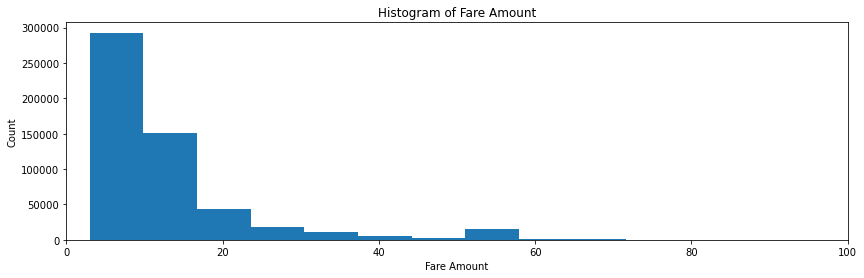

In [108]:
plt.figure(figsize=(14,4))
plt.hist(sample_train["fare_amount"],250)
plt.xlabel('Fare Amount')
plt.ylabel('Count')
plt.title('Histogram of Fare Amount')
plt.xlim(0,100);
plt.savefig('Histogram_Fare Amount.eps', format='eps')

In [109]:
nyc = folium.Map(location=[40.730610, -73.935242],zoom_start=12)

In [110]:
for i in sample_train.index[:1000]:
    folium.CircleMarker(location=[sample_train['PULocation_lat'][i],sample_train['PULocation_lon'][i]], color='green').add_to(nyc)

In [111]:
for i in sample_train.index[:10000]:
    folium.CircleMarker(location=[sample_train['DOLocationID_lat'][i],sample_train['DOLocationID_lon'][i]], color='red').add_to(nyc)

In [112]:
nyc

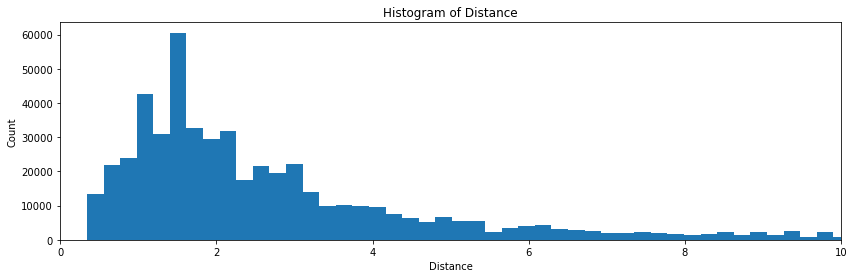

In [113]:
plt.figure(figsize=(14,4))
plt.hist(sample_train["distance"],200)
plt.xlabel('Distance')
plt.ylabel('Count')
plt.title('Histogram of Distance')
plt.xlim(0,10);
plt.savefig('Histogram_Distance.eps', format='eps')

540440
540440


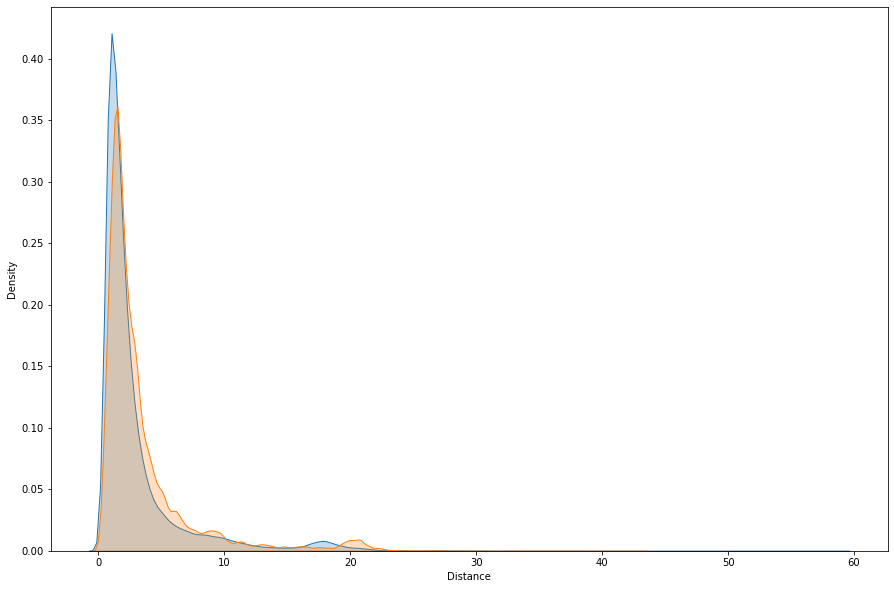

In [114]:
plt.figure(figsize=(15,10))
comparison_column = pd.Series(np.where(sample_train["trip_distance"] == sample_train["distance"], True, False))
print((comparison_column==True).count())
print((comparison_column==False).count())
comparison_column
plt.xlabel('Distance')
sns.kdeplot(data=sample_train['trip_distance'],label = "Trip Distance",shade=True )
sns.kdeplot(data=sample_train['distance'],label = "Distance",shade=True );
#plt.savefig('Histogram_deffrents_Distance.eps', format='eps')

Scatter Plot distance vs Fare amount

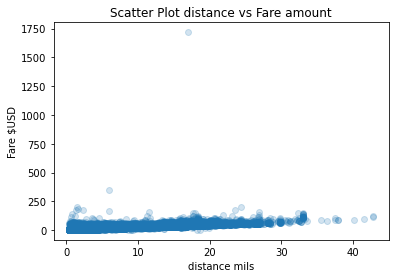

In [115]:
figsize=(20,8)
plt.scatter(sample_train['distance'],sample_train['fare_amount'], alpha=0.2)
plt.xlabel('distance mils')
plt.ylabel('Fare $USD')
plt.title('Scatter Plot distance vs Fare amount');
#plt.savefig('Scatter_distance_Fareamount.eps', format='eps')

Text(0.5, 1.0, 'Fare amount for trips in every hour')

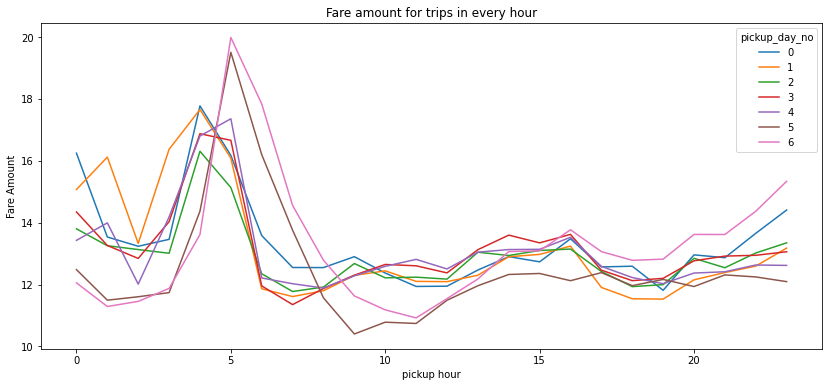

In [116]:
sample_train.pivot_table('fare_amount', index='pickup_hour', columns='pickup_day_no').plot(figsize=(14,6))
plt.xlabel('pickup hour');
plt.ylabel('Fare Amount');
plt.title('Fare amount for trips in every hour') 
#plt.savefig('Fare_amount_every_hour.eps', format='eps')

The most visited area is : [236]


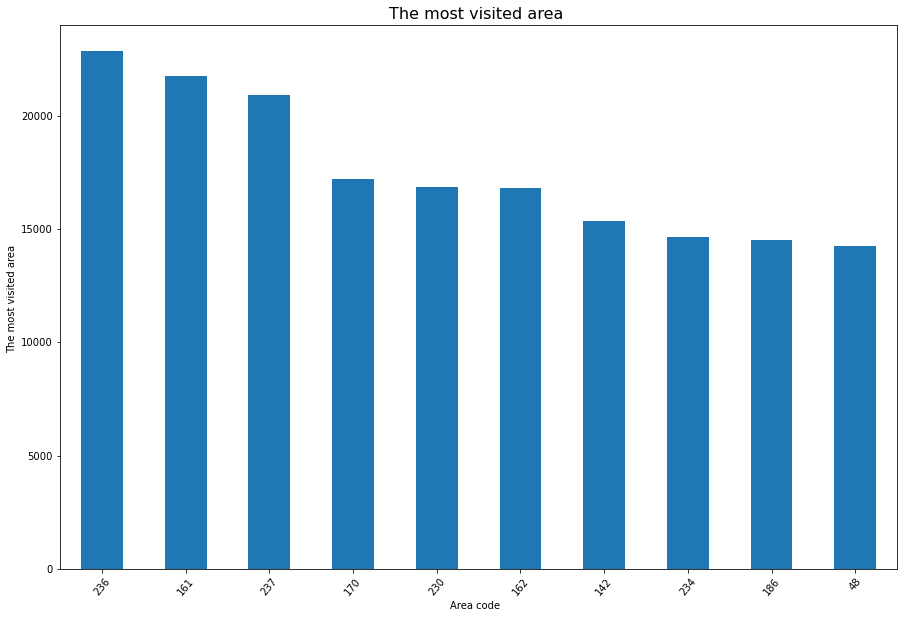

In [117]:
#Q1 : Where is the most visited area?  
n = 1
most_famous_Location= sample_train['DOLocationID'].value_counts()[:n].index.tolist()
print('The most visited area is :',most_famous_Location)
# visulatiziton Q1 :
m=10
plt.figure(figsize=(15,10))
sample_train['DOLocationID'].value_counts()[:m].plot.bar()
plt.xticks(rotation=50)
plt.xlabel("Area code  ")
plt.ylabel("The most visited area ")
plt.title('The most visited area ', fontsize=16)
plt.savefig('mostـvisitedـarea.eps', format='eps')
plt.show();

The most requested day for trips is : [4]


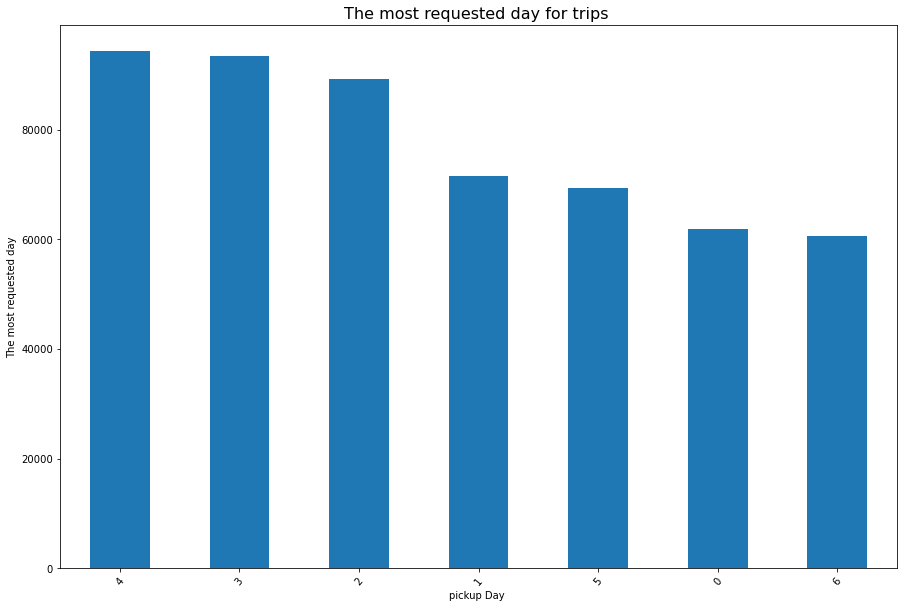

In [118]:
# Q2 When is the most requested day for trips?
n=1
most_requested_day= sample_train['pickup_day_no'].value_counts()[:n].index.tolist()
print('The most requested day for trips is :',most_requested_day)
# visulatiziton Q2 :
plt.figure(figsize=(15,10))
sample_train['pickup_day_no'].value_counts().plot.bar()
plt.xticks(rotation=50)
plt.xlabel("pickup Day ")
plt.ylabel("The most requested day")
plt.title('The most requested day for trips ', fontsize=16);
plt.savefig('mostـrequested_day.eps', format='eps')
plt.show();

In [119]:
def compute_pickups_per_day():
    time = sample_train[['tpep_pickup_datetime','tpep_dropoff_datetime']]
    time['tpep_pickup_datetime'] = pd.to_datetime(time['tpep_pickup_datetime'])
    time["pickup_day"] = time['tpep_pickup_datetime'].dt.strftime('%u').astype(int)
    time["pickup_hour"] = time['tpep_pickup_datetime'].dt.strftime('%H').astype(int)
    set(time['pickup_day'].values)
    day_pickups = []
    night_pickups = []
    mid_night_pickups = []
    afternoon_pickups = []
    for i in range(1,8):
        day_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 6) & (time.pickup_hour < 12)].shape[0])
        night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 18) & (time.pickup_hour <= 23)].shape[0])
        mid_night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 0) & (time.pickup_hour < 6)].shape[0])
        afternoon_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 12) & (time.pickup_hour < 18)].shape[0])
    
    days =pd.DataFrame({'morning':day_pickups, 'afternoon':afternoon_pickups, 'night':night_pickups, 'midnight':mid_night_pickups})
    days.plot(kind='bar', stacked=True,figsize=(15, 10))
    plt.title('Number of pickups for every Days of the week')
    plt.xlabel('Days of the week')
    plt.ylabel('Number of pickups')
    plt.tick_params(axis='both', which='minor')
    plt.plot()
    #plt.xticks(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    for i in range(0,len(days)):
        print ("{} -  morning:{} , day:{} , mid-day:{} night:{}".format(days[i],mid_night_pickups[i],day_pickups[i],afternoon_pickups[i],night_pickups[i]))
    
    return time

<ipython-input-119-8c62d450ea03>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  time['tpep_pickup_datetime'] = pd.to_datetime(time['tpep_pickup_datetime'])
<ipython-input-119-8c62d450ea03>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  time["pickup_day"] = time['tpep_pickup_datetime'].dt.strftime('%u').astype(int)
<ipython-input-119-8c62d450ea03>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the

Monday -  morning:3085 , day:17475 , mid-day:22297 night:19095
Tuesday -  morning:2961 , day:20284 , mid-day:24198 night:24144
Wednesday -  morning:8449 , day:22485 , mid-day:28854 night:29372
Thursday -  morning:4508 , day:24568 , mid-day:30830 night:33563
Friday -  morning:6167 , day:24035 , mid-day:30981 night:33170
Saturday -  morning:9782 , day:12485 , mid-day:23729 night:23301
Sunday -  morning:11307 , day:10967 , mid-day:22494 night:15854


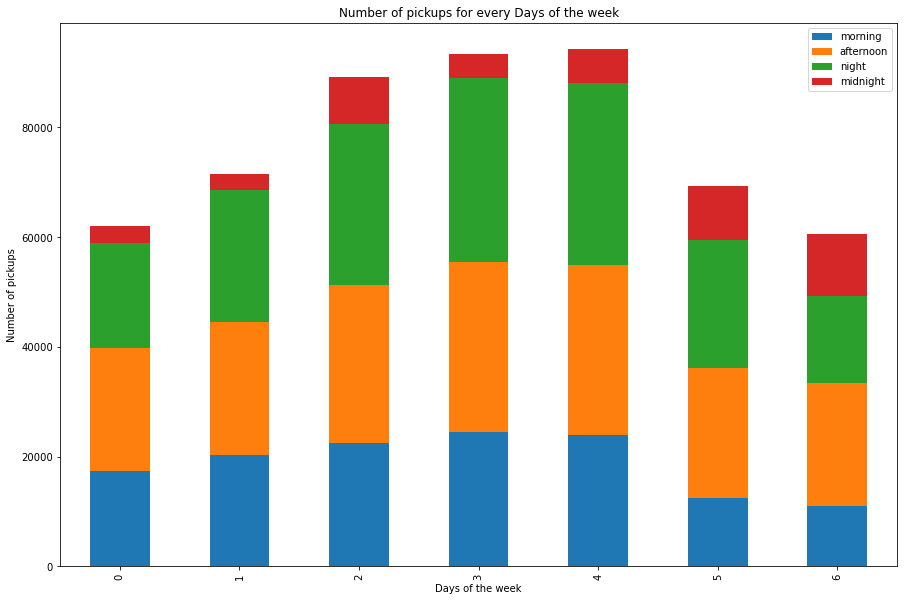

In [120]:
# Q3 :When is the most requested Time for trips?
times_of_day_dframe = compute_pickups_per_day()

#plt.savefig('Number_pickups_Days_week.eps', format='eps')

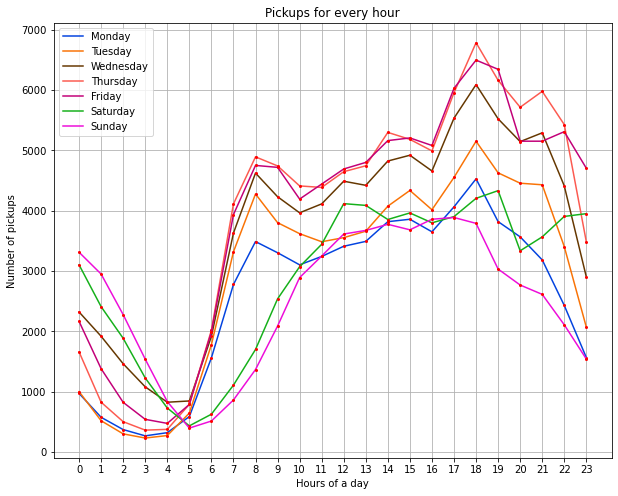

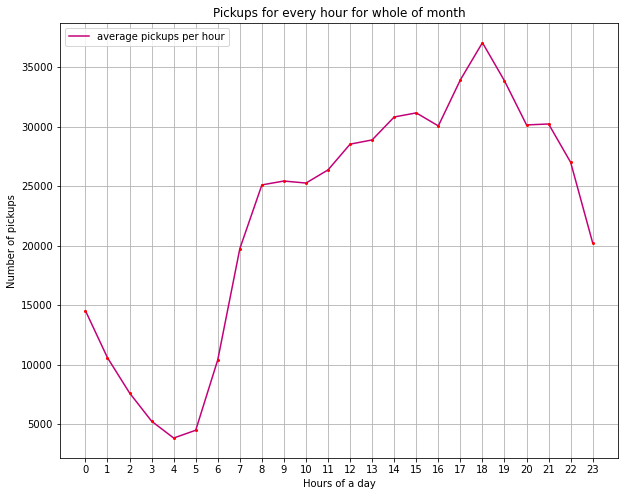

In [121]:
# Q4:What is the number of trips per hour?
def pickup_in_day(frame):
    hour_pickups = []
    temp = []
    for i in range(1,8):
        for j in range(0,24):
            temp.append(frame[(frame.pickup_day == i) & (frame.pickup_hour == j)].shape[0])
        hour_pickups.append(temp)
        temp = []
    colors = ['xkcd:blue','xkcd:orange','xkcd:brown','xkcd:coral','xkcd:magenta','xkcd:green','xkcd:fuchsia']
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

    plt.figure(figsize=(10,8))
    hours_lis = [s for s in range(0,24)]
    for k in range(0,7):
        plt.plot(hours_lis,hour_pickups[k],colors[k],label = days[k])
        plt.plot(hours_lis,hour_pickups[k], 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour')
    plt.legend()
    plt.grid(True)
    #plt.savefig('Pickups_every_hour.eps', format='eps')
    plt.show()
    
    hour_pickup_month = []
    for j in range(0,24):
        hour_pickup_month.append(frame[frame.pickup_hour == j].shape[0])

    plt.figure(figsize=(10,8))
    hours_lis = [s for s in range(0,24)]
    plt.plot(hours_lis,hour_pickup_month,'xkcd:magenta',label = 'average pickups per hour')
    plt.plot(hours_lis,hour_pickup_month, 'ro',  markersize=2)
    

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour for whole of month')
    plt.legend()
    plt.grid(True)
    #plt.savefig('Pickups_every_hour_of_month.eps', format='eps')
    plt.show()
    
pickup_in_day(times_of_day_dframe)

In [122]:
pyment= sample_train["payment_type"].copy()

In [123]:
pyment = pyment.astype(np.int)

<ipython-input-123-e2b258985c2c>:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  pyment = pyment.astype(np.int)


In [124]:
pyment = pyment.astype(np.str)

<ipython-input-124-9eae977e81ad>:1: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  pyment = pyment.astype(np.str)


In [125]:
pyment=pyment.replace({'1':'Credit card', '2': 'Cash' , '3':'No charge', '4': 'Dispute'},regex=True)


In [126]:
pyment

0                Cash
1         Credit card
2                Cash
3         Credit card
4         Credit card
             ...     
540435           Cash
540436    Credit card
540437    Credit card
540438    Credit card
540439    Credit card
Name: payment_type, Length: 540440, dtype: object

The Most used payment method is : ['Credit card']


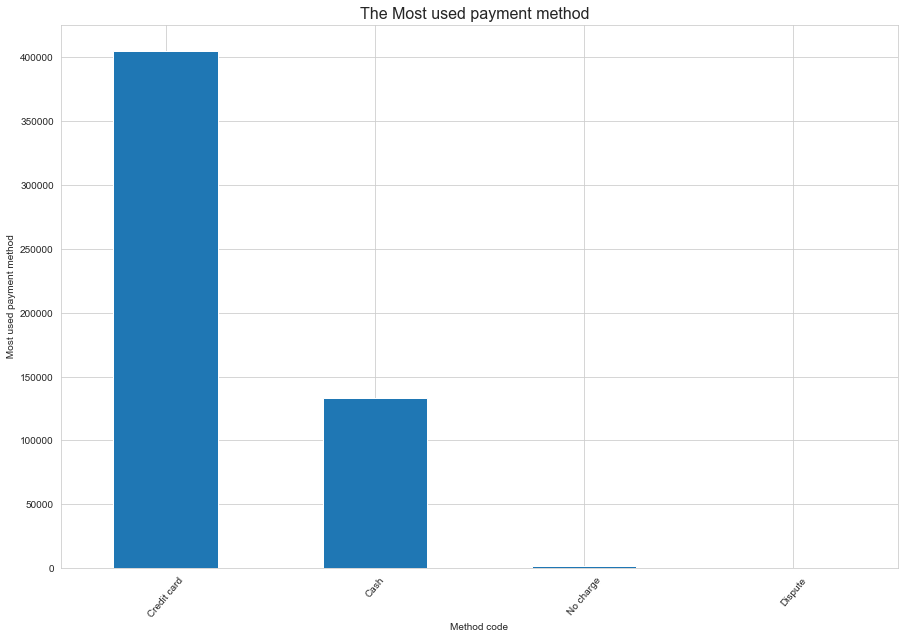

In [127]:
# Q5 : What is the most payment method used?
sns.set_style("whitegrid")
plt.figure(figsize=(15,10))
Most_payment_method= pyment.value_counts()[:n].index.tolist()
print('The Most used payment method is :',Most_payment_method)
pyment.value_counts().plot.bar()
plt.xticks(rotation=50)
plt.xlabel("Method code")
plt.ylabel(" Most used payment method")
plt.title('The Most used payment method  ', fontsize=16);
plt.savefig('Most_used_payment_method.eps', format='eps')
plt.show();

In [128]:
sample_train['passenger_count']=sample_train['passenger_count'].astype(int)

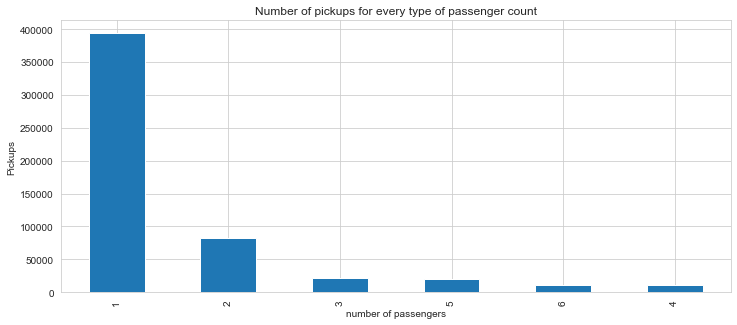

In [129]:
# Q5 : What is the umber of pickups for every type of passenger count?
sns.set_style("whitegrid")
fig, ax = plt.subplots()
fig.set_size_inches(12, 5)
sample_train['passenger_count'].value_counts().plot.bar()
plt.title('Number of pickups for every type of passenger count')
plt.xlabel('number of passengers')
plt.ylabel('Pickups');
plt.savefig('Number_pickups_passenger_count.eps', format='eps')

correletion

In [130]:
#sns.pairplot(sample_train[:1000], plot_kws=dict(alpha=.1, edgecolor='none'))

<AxesSubplot:>

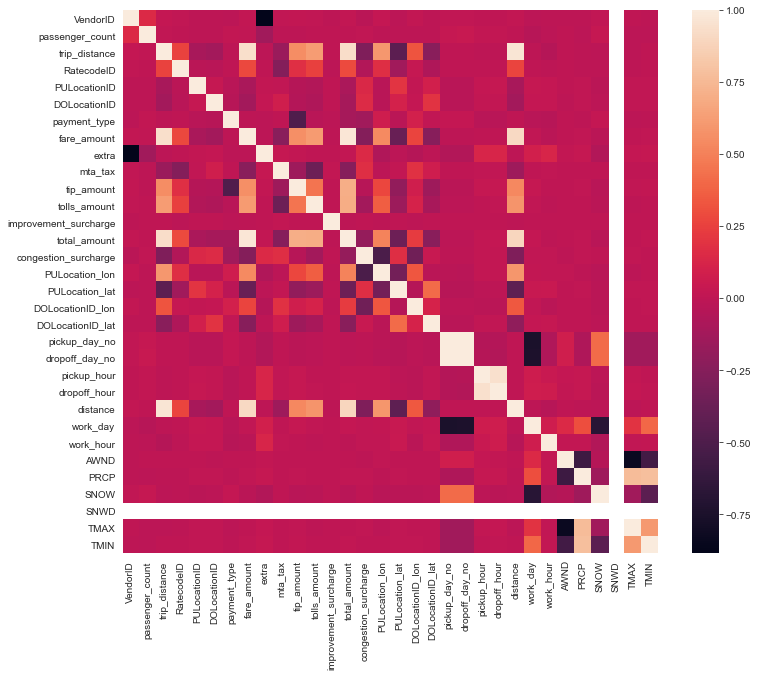

In [131]:
plt.figure(figsize=(12, 10))
sns.heatmap(sample_train.corr())

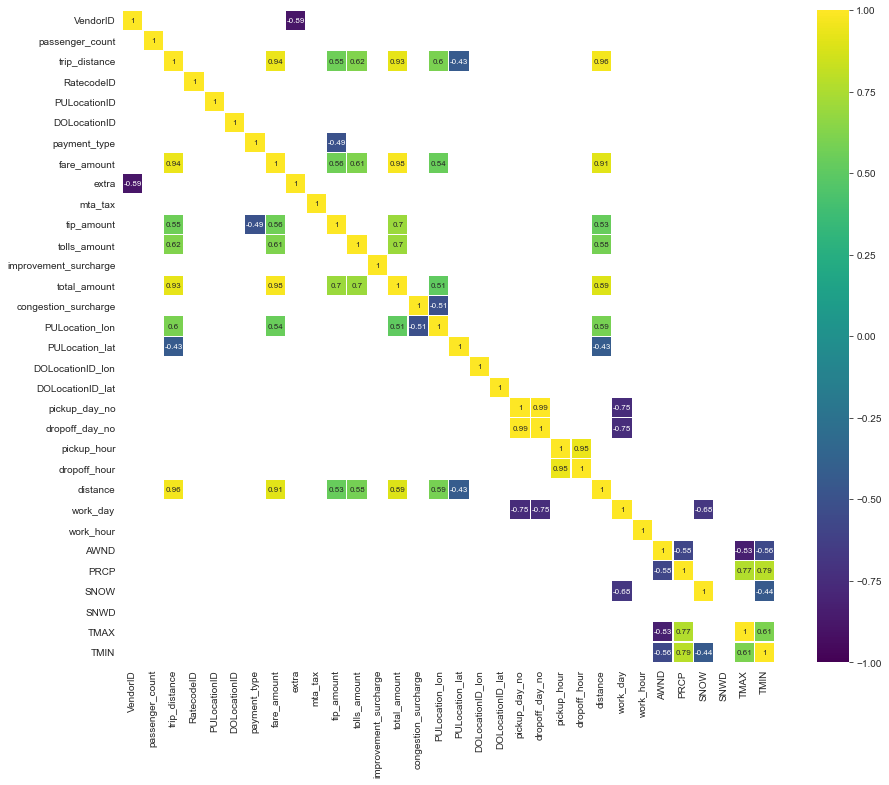

In [132]:
corr = sample_train.corr()
plt.figure(figsize=(15, 12))
sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);
plt.savefig('heatmap.eps', format='eps')

In [133]:
df_num_corr = sample_train.corr()['fare_amount'][:-1] # -1 because the latest row is SalePrice
golden_features_list = df_num_corr[abs(df_num_corr) > 0.5].sort_values(ascending=False)
print("There is {} strongly correlated values with SalePrice:\n{}".format(len(golden_features_list), golden_features_list))

There is 7 strongly correlated values with SalePrice:
fare_amount       1.000000
total_amount      0.976850
trip_distance     0.940296
distance          0.907576
tolls_amount      0.613964
tip_amount        0.562750
PULocation_lon    0.541535
Name: fare_amount, dtype: float64


Linear Regression

In [164]:
x=sample_train[['congestion_surcharge','distance','pickup_day_no','pickup_hour'
              ,'AWND','PRCP','SNOW','SNWD','TMAX','TMIN','work_hour','work_day']]

In [165]:
X_train,y_train = x, sample_train['fare_amount']

In [166]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

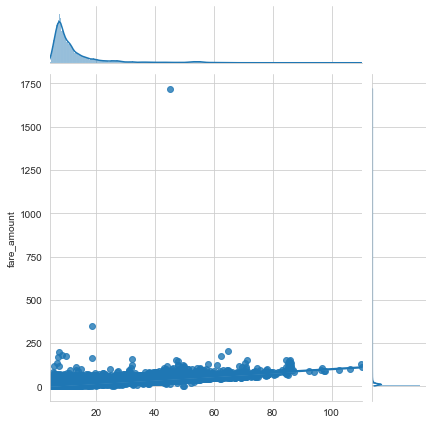

In [137]:
preds = lr_model.predict(X_train) 
sns.jointplot(x=preds,y=y_train, kind='reg')
#plt.savefig('LinearRegression_training.eps', format='eps');

In [167]:
lr_model.score(X_train,y_train)

0.824535235093244

In [168]:
xx=sample_val[['congestion_surcharge','distance','pickup_day_no','pickup_hour'
              ,'AWND','PRCP','SNOW','SNWD','TMAX','TMIN','work_hour','work_day']]

In [169]:
X_val,y_val = xx, sample_val['fare_amount']

In [170]:
lr_model.score(X_val,y_val)

0.8618763483825055

In [171]:
xxx=sample_test[['congestion_surcharge','distance','pickup_day_no','pickup_hour'
              ,'AWND','PRCP','SNOW','SNWD','TMAX','TMIN','work_hour','work_day']]

In [172]:
X_test,y_test = xxx, sample_test['fare_amount']

In [173]:
acluracy=lr_model.score(X_test,y_test)
acluracy

0.8649866400680464

In [174]:
pred = lr_model.predict(X_test)

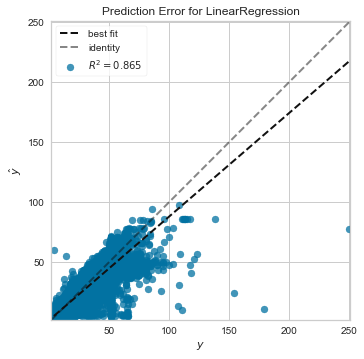

<AxesSubplot:title={'center':'Prediction Error for LinearRegression'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [175]:
from yellowbrick.regressor import prediction_error
visualizer = prediction_error(lr_model, X_train, y_train, X_test, y_test)
visualizer.show()

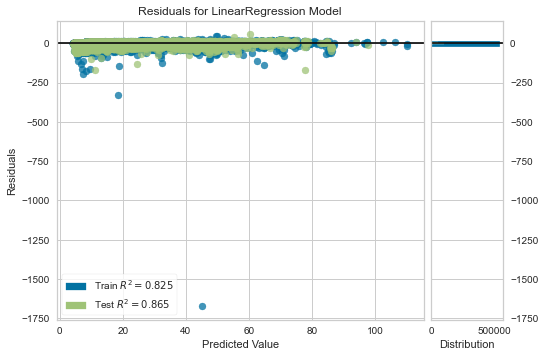

<AxesSubplot:title={'center':'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [147]:
from yellowbrick.regressor import ResidualsPlot
visualizer = ResidualsPlot(LinearRegression())
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()
#plt.savefig('Residual_LinearRegression_Model.png')

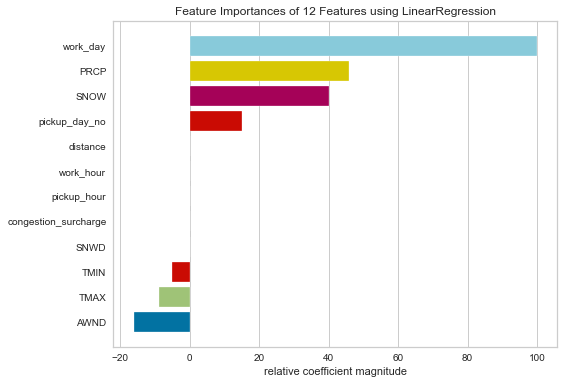

<AxesSubplot:title={'center':'Feature Importances of 12 Features using LinearRegression'}, xlabel='relative coefficient magnitude'>

In [148]:
from yellowbrick.model_selection import FeatureImportances
viz = FeatureImportances(lr_model)
viz.fit(X_train, y_train)
viz.show()

In [149]:
res = pd.DataFrame(pred)

In [150]:
res['actual'] = y_test

In [151]:
res.columns=['predict','actual']

In [152]:
res['difference'] = res['predict'] - res['actual']

In [153]:
res

,predict,actual,difference
0,12.719574,17.0,-4.280426
1,12.719574,12.5,0.219574
2,12.775787,17.5,-4.724213
3,12.722565,18.0,-5.277435
4,13.061890,13.0,0.061890
...,...,...,...
180139,22.450104,20.5,1.950104
180140,43.749146,52.0,-8.250854
180141,55.000488,50.0,5.000488
180142,59.574188,57.5,2.074188


In [154]:
degree = 2
est = make_pipeline(PolynomialFeatures(degree), LinearRegression())
est.fit(X_train, y_train)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('linearregression', LinearRegression())])

In [155]:
est.score(X_train,y_train)

0.8283968466434957

In [156]:
est.score(X_val,y_val)

0.8662249825822061

In [157]:
est.score(X_test,y_test)

0.8690445316658879

In [158]:
pred = est.predict(X_test)

In [159]:
res1 = pd.DataFrame(pred)

In [160]:
res1['actual'] = y_test

In [161]:
res1.columns=['predict','actual']

In [162]:
res1['difference'] = res1['predict'] - res1['actual']

In [163]:
res1 

,predict,actual,difference
0,12.435303,17.0,-4.564697
1,12.435303,12.5,-0.064697
2,12.422852,17.5,-5.077148
3,12.654785,18.0,-5.345215
4,13.315674,13.0,0.315674
...,...,...,...
180139,22.869019,20.5,2.369019
180140,44.841675,52.0,-7.158325
180141,53.646973,50.0,3.646973
180142,56.934082,57.5,-0.565918
